In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

dataset_path = '/content/drive/MyDrive/PCD/train'
class_names = os.listdir(dataset_path)
print(f"nama file {class_names}")

nama file ['n12710693_7386_png_jpg.rf.91943738cbc24e40313f992f51058bf2.jpg', 'Gatton1_valid_20141204T1614_frame0025_png_jpg.rf.d1f428e19ac18d4466e384b3b2f8a09e.jpg', 'img_2017_png_jpg.rf.64c6018c1860f8e793305a4510697575.jpg', '47_2_png_jpg.rf.d65549d38d16a1303008912d20e16374.jpg', 'Gatton1_test_2014204T1614_frame0018_png_jpg.rf.a3dbe3f5e0558d6bf263bb7ff5abbbcb.jpg', 'Gatton1_test_20141204T1836_frame0032_png_jpg.rf.936292b96c5cbc481c56528bd6ff20cf.jpg', 'n12761284_9555_png_jpg.rf.6cc0baf06a74933ec7db327170ec2afc.jpg', 'n12761284_12495_png_jpg.rf.71401ba27d9a6c903fbce755d6ca41c5.jpg', 'n12761284_2068_png_jpg.rf.a0ab735570ed78b40b5d65ae06d234f9.jpg', 'n12761284_7395_png_jpg.rf.43f8bf71c7cc355b60e7a72e1a97e5c4.jpg', 'Stanthorpe1_test_20150319T1636_pic000224_png_jpg.rf.ab943bce11666713a9becb88d147d882.jpg', 'Gatton1_valid_20141204T1836_frame0025_png_jpg.rf.5c52ab076f81dd8a4f75689fb2409d11.jpg', 'Gatton2_valid_20150429T1831_pic000119_png_jpg.rf.9eee48a29163d9ac68db236abb7a45fb.jpg', 'n127612

In [ ]:
import os

# Ganti dengan path ke folder dataset kamu
dataset_path = '/content/drive/MyDrive/PCD/train/'

# Hitung semua file di dalam folder (bukan folder)
jumlah_file = len([
    f for f in os.listdir(dataset_path)
    if os.path.isfile(os.path.join(dataset_path, f))
])

print("Jumlah file dalam folder:", jumlah_file)


Jumlah file dalam folder: 1199


# Konversi gambar ke grayscale

In [ ]:
import os
import cv2

# Langsung ambil dari folder berisi gambar
input_base = '/content/drive/MyDrive/PCD/train'
output_base = '/content/drive/MyDrive/PCD/grayscale_image'

os.makedirs(output_base, exist_ok=True)

jumlah = 0
for file in os.listdir(input_base):
    if file.lower().endswith(('.jpg', '.jpeg', '.png')):
        img_path = os.path.join(input_base, file)
        img = cv2.imread(img_path)

        if img is None:
            print(f"[!] Gagal membaca {img_path}")
            continue

        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        save_path = os.path.join(output_base, file)
        cv2.imwrite(save_path, gray)
        jumlah += 1

print(f"✅ Berhasil konversi {jumlah} gambar ke grayscale.")

✅ Berhasil konversi 1198 gambar ke grayscale.


In [ ]:
import os

output_check = '/content/drive/MyDrive/PCD/grayscale_image'
print("Isi folder hasil grayscale:")
print(os.listdir(output_check))

Isi folder hasil grayscale:
['n12710693_7386_png_jpg.rf.91943738cbc24e40313f992f51058bf2.jpg', 'Gatton1_valid_20141204T1614_frame0025_png_jpg.rf.d1f428e19ac18d4466e384b3b2f8a09e.jpg', 'img_2017_png_jpg.rf.64c6018c1860f8e793305a4510697575.jpg', '47_2_png_jpg.rf.d65549d38d16a1303008912d20e16374.jpg', 'Gatton1_test_2014204T1614_frame0018_png_jpg.rf.a3dbe3f5e0558d6bf263bb7ff5abbbcb.jpg', 'Gatton1_test_20141204T1836_frame0032_png_jpg.rf.936292b96c5cbc481c56528bd6ff20cf.jpg', 'n12761284_9555_png_jpg.rf.6cc0baf06a74933ec7db327170ec2afc.jpg', 'n12761284_12495_png_jpg.rf.71401ba27d9a6c903fbce755d6ca41c5.jpg', 'n12761284_2068_png_jpg.rf.a0ab735570ed78b40b5d65ae06d234f9.jpg', 'n12761284_7395_png_jpg.rf.43f8bf71c7cc355b60e7a72e1a97e5c4.jpg', 'Stanthorpe1_test_20150319T1636_pic000224_png_jpg.rf.ab943bce11666713a9becb88d147d882.jpg', 'Gatton1_valid_20141204T1836_frame0025_png_jpg.rf.5c52ab076f81dd8a4f75689fb2409d11.jpg', 'Gatton2_valid_20150429T1831_pic000119_png_jpg.rf.9eee48a29163d9ac68db236abb7a4

In [ ]:
import os
dataset_path = '/content/drive/MyDrive/PCD/grayscale_image'

# Hitung semua file di dalam folder (bukan folder)
jumlah_file = len([
    f for f in os.listdir(dataset_path)
    if os.path.isfile(os.path.join(dataset_path, f))
])

print("Jumlah file dalam folder:", jumlah_file)

Jumlah file dalam folder: 1198


# 1. Menambahkan beberapa model noise ke citra

In [ ]:
import os
import cv2
import numpy as np

# Path input dan output
input_folder = '/content/drive/MyDrive/PCD/grayscale_image'
output_base = '/content/drive/MyDrive/PCD/noised_grayscale_image'

# Fungsi noise
def add_rayleigh_noise(image, scale=30):
    noise = np.random.rayleigh(scale, image.shape)
    return np.clip(image + noise, 0, 255).astype(np.uint8)

def add_erlang_noise(image, shape=2, scale=10):
    noise = np.random.gamma(shape, scale, image.shape)
    return np.clip(image + noise, 0, 255).astype(np.uint8)

def add_exponential_noise(image, scale=15):
    noise = np.random.exponential(scale, image.shape)
    return np.clip(image + noise, 0, 255).astype(np.uint8)

def add_uniform_noise(image, low=-20, high=20):
    noise = np.random.uniform(low, high, image.shape)
    return np.clip(image + noise, 0, 255).astype(np.uint8)

def add_salt_and_pepper_noise(image, prob=0.01):
    noisy = np.copy(image)
    rand = np.random.rand(*image.shape)
    noisy[rand < prob / 2] = 0
    noisy[rand > 1 - prob / 2] = 255
    return noisy

def add_gaussian_noise(image, mean=0, std=10):
    noise = np.random.normal(mean, std, image.shape)
    return np.clip(image + noise, 0, 255).astype(np.uint8)

# Mapping jenis noise ke fungsi
noise_functions = {
    'rayleigh': add_rayleigh_noise,
    'erlang': add_erlang_noise,
    'exponential': add_exponential_noise,
    'uniform': add_uniform_noise,
    'salt_pepper': add_salt_and_pepper_noise,
    'gaussian': add_gaussian_noise
}

# Proses semua gambar untuk semua noise
for img_file in os.listdir(input_folder):
    if img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
        img_path = os.path.join(input_folder, img_file)
        img = cv2.imread(img_path)
        if img is None:
            continue

        for noise_name, noise_func in noise_functions.items():
            output_dir = os.path.join(output_base, noise_name)
            os.makedirs(output_dir, exist_ok=True)

            noisy_img = noise_func(img)
            output_path = os.path.join(output_dir, f'{noise_name}_{img_file}')
            cv2.imwrite(output_path, noisy_img)

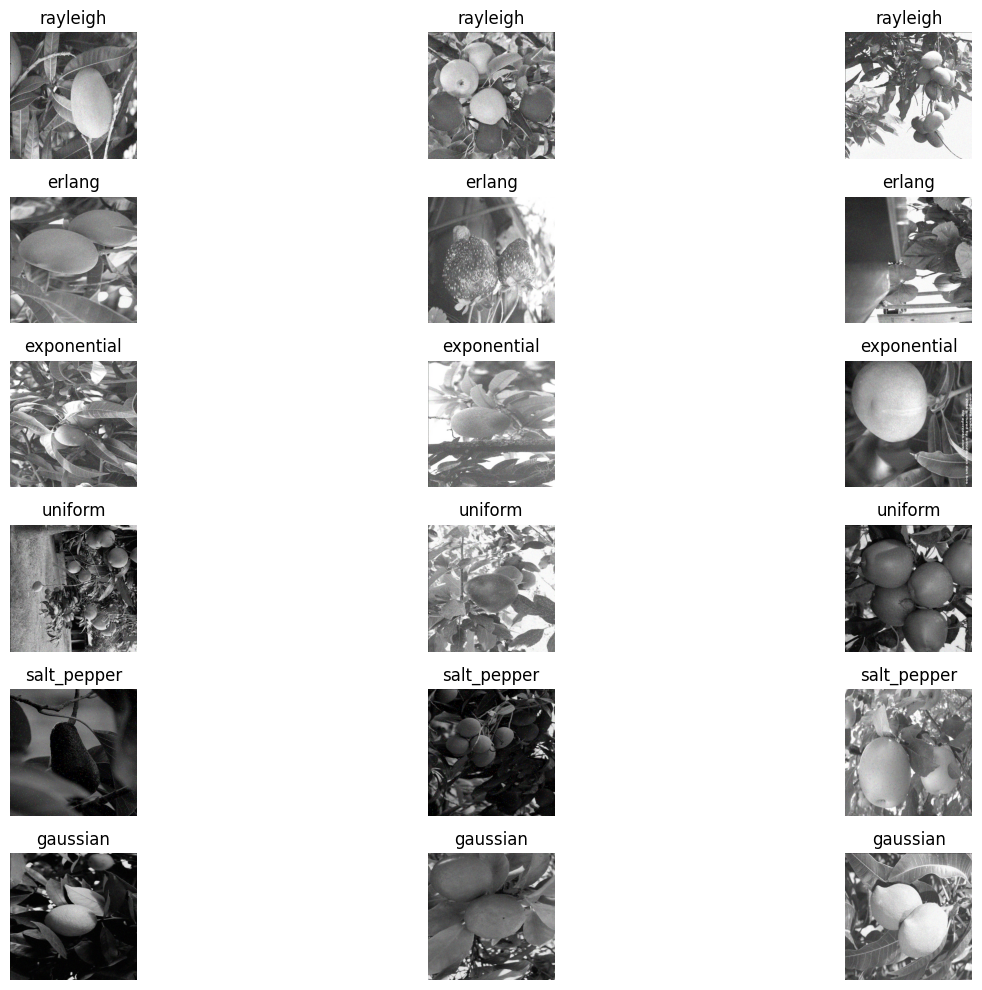

In [ ]:
import random
import matplotlib.pyplot as plt

# Path dasar
noised_base_path = '/content/drive/MyDrive/PCD/noised_grayscale_image'
noise_types = ['rayleigh', 'erlang', 'exponential', 'uniform', 'salt_pepper', 'gaussian']
sample_per_folder = 3

# Fungsi tampilkan gambar
def show_samples(noise_folders, samples=3):
    plt.figure(figsize=(15, 10))
    index = 1

    for noise in noise_folders:
        folder_path = os.path.join(noised_base_path, noise)
        all_images = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
        selected_images = random.sample(all_images, min(samples, len(all_images)))

        for img_name in selected_images:
            img_path = os.path.join(folder_path, img_name)
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            plt.subplot(len(noise_folders), samples, index)
            plt.imshow(img)
            plt.axis('off')
            plt.title(f'{noise}')
            index += 1

    plt.tight_layout()
    plt.show()

# Tampilkan sample
show_samples(noise_types, sample_per_folder)

# 2. Melakukan restorasi citra dengan beberapa teknik filtering

In [ ]:
import os
import cv2
import numpy as np
from scipy.ndimage import generic_filter, median_filter
from scipy.signal import wiener
import matplotlib.pyplot as plt

# Fungsi tampilkan gambar
def show_image(image, title=''):
    plt.figure(figsize=(4, 4))
    plt.imshow(image, cmap='gray')
    plt.title(title)
    plt.axis('off')
    plt.show()

In [ ]:
# Filter: Geometric Mean (Spatial)
def geometric_mean_filter(image, ksize=5):
    def geo_mean(x):
        x = x + 1e-8
        return np.exp(np.mean(np.log(x)))
    return generic_filter(image.astype(float), geo_mean, size=ksize).astype(np.uint8)

# Filter: Harmonic Mean (Spatial)
def harmonic_mean_filter(image, ksize=5):
    def harmonic(x):
        x = x + 1e-8
        return len(x) / np.sum(1.0 / x)
    return generic_filter(image.astype(float), harmonic, size=ksize).astype(np.uint8)

# Filter: Contraharmonic Mean (Spatial/Adaptive)
def contraharmonic_mean_filter(image, ksize=3, Q=1.5):
    def contraharmonic(x):
        num = np.sum(np.power(x, Q + 1))
        denom = np.sum(np.power(x, Q))
        return num / (denom + 1e-8)
    return generic_filter(image.astype(float), contraharmonic, size=ksize).astype(np.uint8)

# Filter: Median (Order-statistic)
def median_filtering(image, ksize=5):
    return median_filter(image, size=ksize)

def wiener_filtering(image, mysize=3, noise=None):
    return wiener(image, mysize=mysize, noise=noise).astype(np.uint8)

In [ ]:
import os
import cv2
import numpy as np
import random
from datetime import datetime

# Mapping aturan noise dan filter yang cocok untuk citra grayscale
noise_filter_map_gray = {
    "gaussian": ["wiener", "median"],
    "salt_pepper": ["median", "contraharmonic"],
    "rayleigh": ["geometric", "wiener"],
    "erlang": ["harmonic", "wiener"],
    "exponential": ["harmonic", "geometric"],
    "uniform": ["median"]
}

# Dictionary fungsi-fungsi filter
filter_functions_gray = {
    "geometric": geometric_mean_filter,
    "harmonic": harmonic_mean_filter,
    "contraharmonic": contraharmonic_mean_filter,
    "median": median_filtering,
    "wiener": wiener_filtering
}

# helper folder allocation

def ensure_folder(path):
    os.makedirs(path, exist_ok=True)

def clean_filename(base):
    return base.replace(" ", "_").replace(".", "_")

# Filtering Citra

def process_grayscale_filtering(image, noise_type, image_name, base_output="/content/output_gray"):
    filters = noise_filter_map_gray.get(noise_type, [])
    for filt in filters:
        folder_name = f"{noise_type}-{filt}"
        save_dir = os.path.join(base_output, folder_name)
        ensure_folder(save_dir)

        result = filter_functions_gray[filt](image)

        timestamp = datetime.now().strftime("%Y%m%d%H%M%S%f")
        base_name = os.path.splitext(image_name)[0]
        clean_name = clean_filename(base_name)
        filename = f"{clean_name}_{noise_type}_{filt}_{timestamp}.jpg"
        path_to_save = os.path.join(save_dir, filename)

        cv2.imwrite(path_to_save, result)
        print(f"✅ Disimpan (grayscale): {path_to_save}")

# 10 sample per noise

def process_sample_grayscale(noise_folder, noise_type, sample_count=10, base_output="/content/output_gray"):
    images = [f for f in os.listdir(noise_folder) if f.lower().endswith((".jpg", ".jpeg", ".png"))]
    selected = random.sample(images, min(sample_count, len(images)))

    for image_name in selected:
        image_path = os.path.join(noise_folder, image_name)
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        if image is not None:
            process_grayscale_filtering(image, noise_type, image_name, base_output)

# eksekusi semua noise

noised_base = '/content/drive/MyDrive/PCD/noised_grayscale_image'
output_base = '/content/drive/MyDrive/PCD/filtered_all_grayscale'
noise_types = ['gaussian', 'salt_pepper', 'rayleigh', 'erlang', 'exponential', 'uniform']

# Buat folder output utama jika belum ada
ensure_folder(output_base)

# Proses 10 gambar per noise
for noise in noise_types:
    noise_path = os.path.join(noised_base, noise)
    print(f"\n🔄 Memproses noise: {noise}")
    if os.path.exists(noise_path):
        process_sample_grayscale(noise_path, noise, sample_count=10, base_output=output_base)
    else:
        print(f"⚠️  Folder tidak ditemukan: {noise_path}")





🔄 Memproses noise: gaussian
✅ Disimpan (grayscale): /content/drive/MyDrive/PCD/filtered_all_grayscale/gaussian-wiener/gaussian_berry-report2_png_jpg_rf_0334e99f2777c61582bd4c20d8f6c311_gaussian_wiener_20250521082221719990.jpg
✅ Disimpan (grayscale): /content/drive/MyDrive/PCD/filtered_all_grayscale/gaussian-median/gaussian_berry-report2_png_jpg_rf_0334e99f2777c61582bd4c20d8f6c311_gaussian_median_20250521082221873750.jpg
✅ Disimpan (grayscale): /content/drive/MyDrive/PCD/filtered_all_grayscale/gaussian-wiener/gaussian_n12710693_4630_png_jpg_rf_c7cf544042898cf190178529474ef40c_gaussian_wiener_20250521082221944628.jpg
✅ Disimpan (grayscale): /content/drive/MyDrive/PCD/filtered_all_grayscale/gaussian-median/gaussian_n12710693_4630_png_jpg_rf_c7cf544042898cf190178529474ef40c_gaussian_median_20250521082222087778.jpg
✅ Disimpan (grayscale): /content/drive/MyDrive/PCD/filtered_all_grayscale/gaussian-wiener/gaussian_IMG_0768_png_jpg_rf_5dd41cf56585e701f8669c586ee168bc_gaussian_wiener_202505210

<ipython-input-5-b7a6a9552974>:28: RuntimeWarning: invalid value encountered in cast
  return wiener(image, mysize=mysize, noise=noise).astype(np.uint8)


✅ Disimpan (grayscale): /content/drive/MyDrive/PCD/filtered_all_grayscale/gaussian-median/gaussian_n12761284_3687_png_jpg_rf_30a991807a09a2b4bb7eba677e54f414_gaussian_median_20250521082222742712.jpg
✅ Disimpan (grayscale): /content/drive/MyDrive/PCD/filtered_all_grayscale/gaussian-wiener/gaussian_anna-apple_png_jpg_rf_0e5521e45432892f4631cc979a9a5cfd_gaussian_wiener_20250521082222797370.jpg
✅ Disimpan (grayscale): /content/drive/MyDrive/PCD/filtered_all_grayscale/gaussian-median/gaussian_anna-apple_png_jpg_rf_0e5521e45432892f4631cc979a9a5cfd_gaussian_median_20250521082222942475.jpg
✅ Disimpan (grayscale): /content/drive/MyDrive/PCD/filtered_all_grayscale/gaussian-wiener/gaussian_img_2017_png_jpg_rf_b4b875c3293bb1ffb0ef521fb668fe28_gaussian_wiener_20250521082222999858.jpg
✅ Disimpan (grayscale): /content/drive/MyDrive/PCD/filtered_all_grayscale/gaussian-median/gaussian_img_2017_png_jpg_rf_b4b875c3293bb1ffb0ef521fb668fe28_gaussian_median_20250521082223144701.jpg


/usr/local/lib/python3.11/dist-packages/scipy/signal/_signaltools.py:1673: RuntimeWarning: divide by zero encountered in divide
  res *= (1 - noise / lVar)


✅ Disimpan (grayscale): /content/drive/MyDrive/PCD/filtered_all_grayscale/gaussian-wiener/gaussian_n12761284_8383_png_jpg_rf_65cc0e7553e563e238f964a4fe6cbc82_gaussian_wiener_20250521082223216190.jpg
✅ Disimpan (grayscale): /content/drive/MyDrive/PCD/filtered_all_grayscale/gaussian-median/gaussian_n12761284_8383_png_jpg_rf_65cc0e7553e563e238f964a4fe6cbc82_gaussian_median_20250521082223360256.jpg
✅ Disimpan (grayscale): /content/drive/MyDrive/PCD/filtered_all_grayscale/gaussian-wiener/gaussian_n11706761_19738_png_jpg_rf_d3cc21d673cebb6d0ebf86780e4b349e_gaussian_wiener_20250521082223520267.jpg
✅ Disimpan (grayscale): /content/drive/MyDrive/PCD/filtered_all_grayscale/gaussian-median/gaussian_n11706761_19738_png_jpg_rf_d3cc21d673cebb6d0ebf86780e4b349e_gaussian_median_20250521082236452205.jpg
✅ Disimpan (grayscale): /content/drive/MyDrive/PCD/filtered_all_grayscale/gaussian-wiener/gaussian_Gatton1_valid_20141204T1836_frame0015_png_jpg_rf_c81b7879585304b51f9b866cb6636716_gaussian_wiener_20250

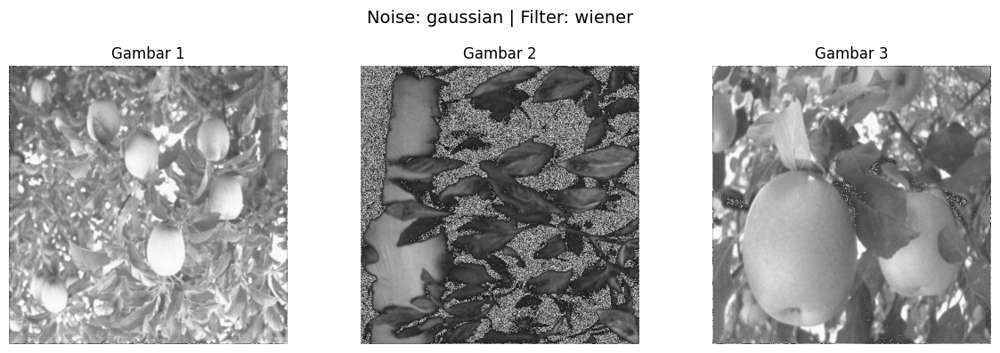

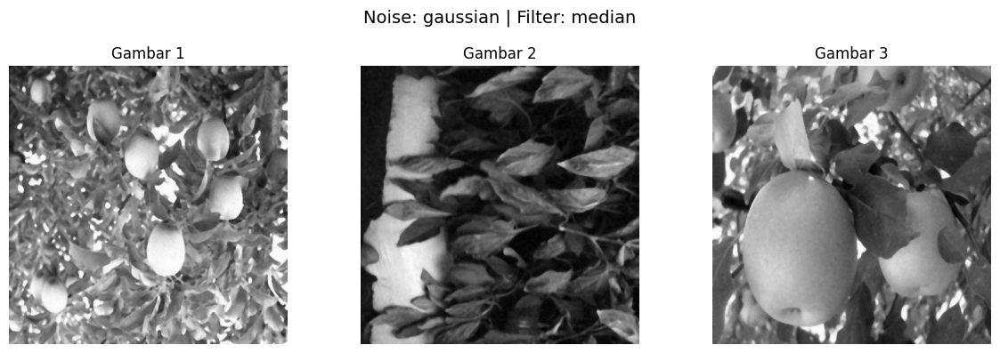

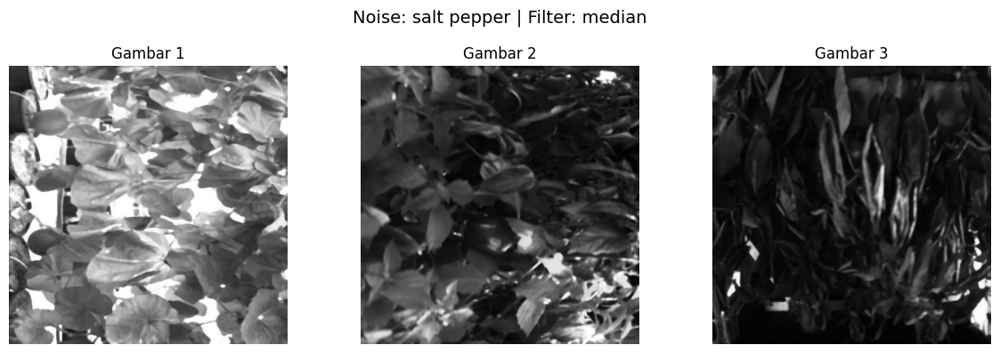

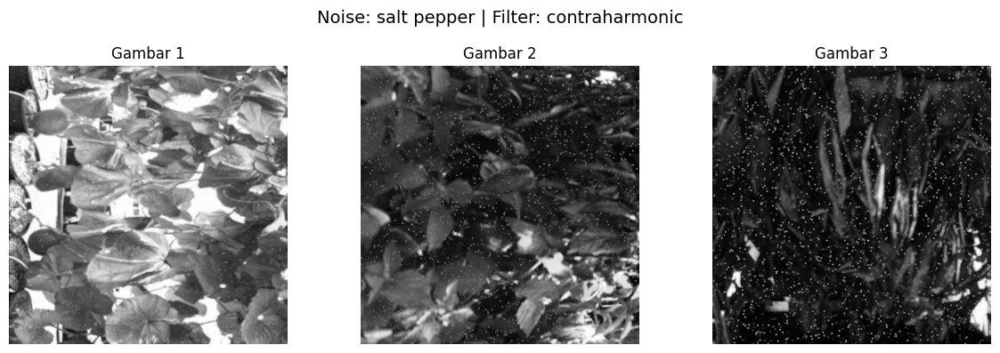

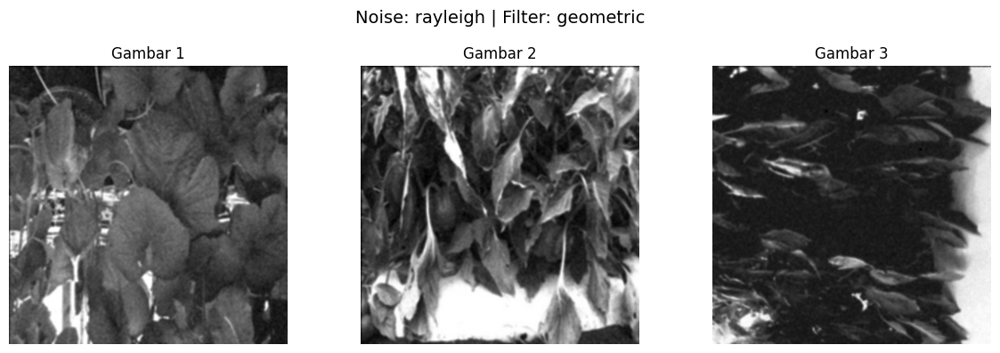

...

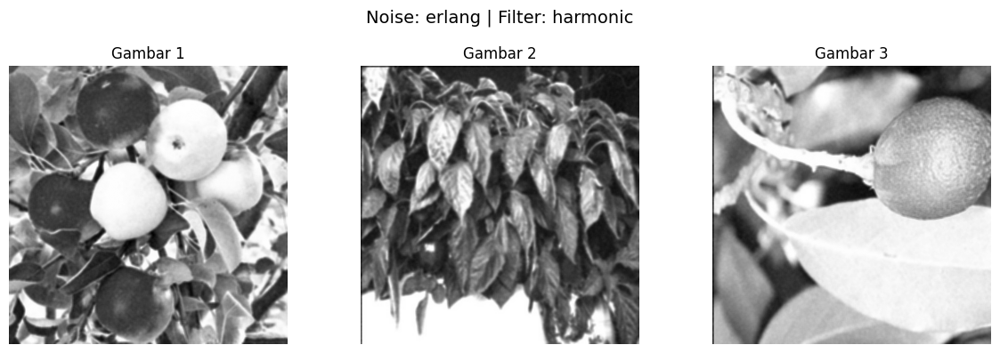

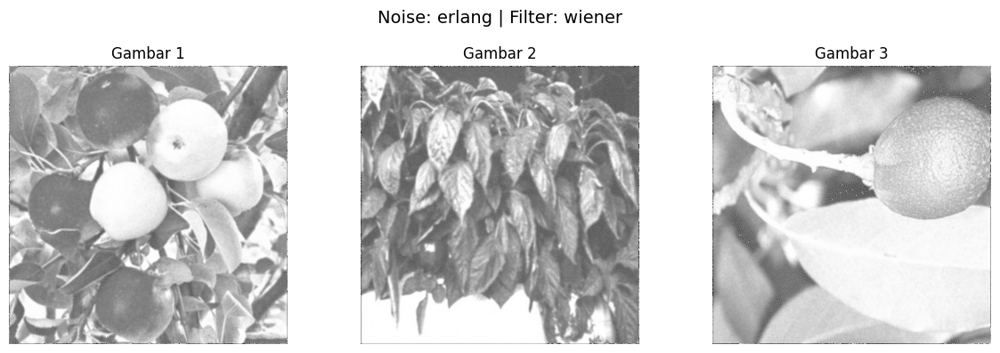

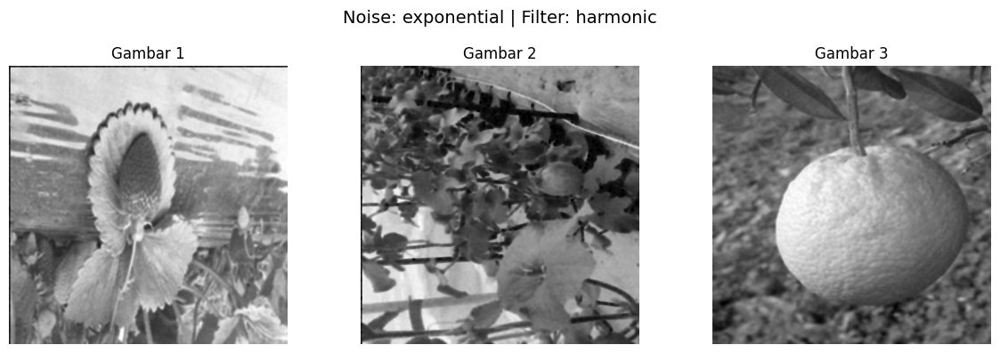

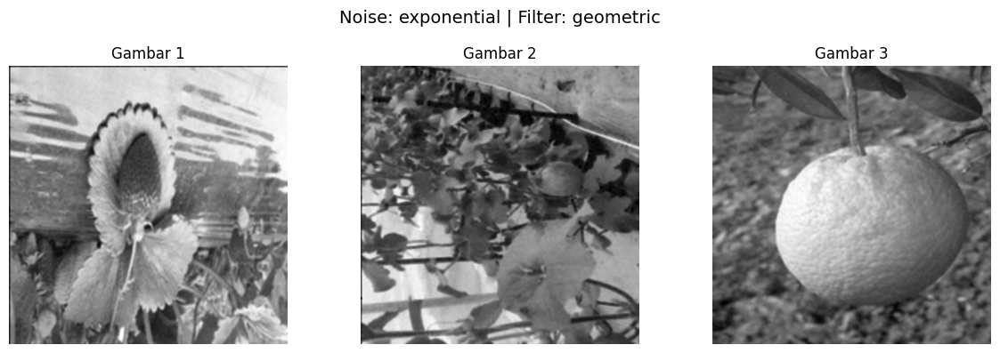

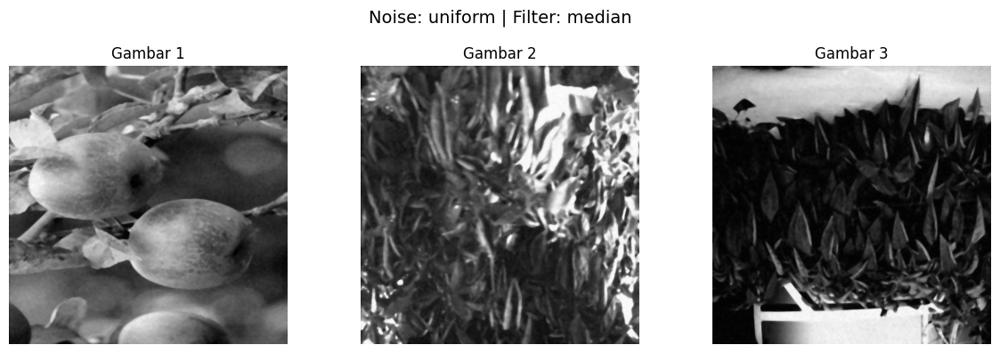

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import cv2

def display_each_noise_filter_row(base_output="/content/drive/MyDrive/PCD/filtered_all_grayscale"):
    noise_filter_map_gray = {
        "gaussian": ["wiener"],
        "salt_pepper": ["median", "contraharmonic"],
        "rayleigh": ["geometric", "wiener"],
        "erlang": ["harmonic", "wiener"],
        "exponential": ["harmonic", "geometric"],
        "uniform": ["median"]
    }

    for noise, filters in noise_filter_map_gray.items():
        for filt in filters:
            folder_name = f"{noise}-{filt}"
            folder_path = os.path.join(base_output, folder_name)

            if os.path.exists(folder_path):
                image_files = sorted([f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.png'))])[:3]
                images = []
                for f in image_files:
                    img_path = os.path.join(folder_path, f)
                    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
                    if img is not None:
                        images.append(img)

                if images:
                    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
                    fig.suptitle(f"Noise: {noise.replace('_', ' ')} | Filter: {filt}", fontsize=14)

                    for i in range(3):
                        axs[i].imshow(images[i], cmap='gray')
                        axs[i].axis('off')
                        axs[i].set_title(f"Gambar {i+1}")

                    plt.tight_layout()
                    plt.subplots_adjust(top=0.82)
                    plt.show()

# Panggil fungsi
display_each_noise_filter_row()

# 3. Melakukan analisis hasil restorasi citra dengan berbagai teknik filtering

In [ ]:
import numpy as np

# Fungsi MSE (Mean Squared Error)
def compute_mse(original, restored):
    return np.mean((original.astype("float32") - restored.astype("float32")) ** 2)

# Fungsi PSNR (Peak Signal-to-Noise Ratio)
def compute_psnr(original, restored):
    mse = compute_mse(original, restored)
    if mse == 0:
        return float("inf")
    pixel_max = 255.0
    return 20 * np.log10(pixel_max / np.sqrt(mse))

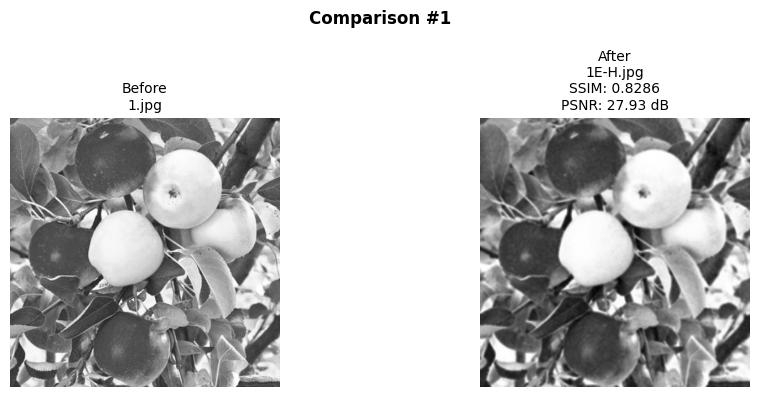

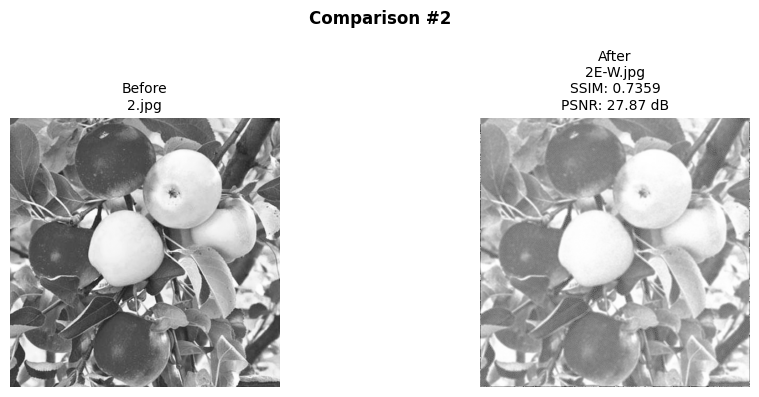

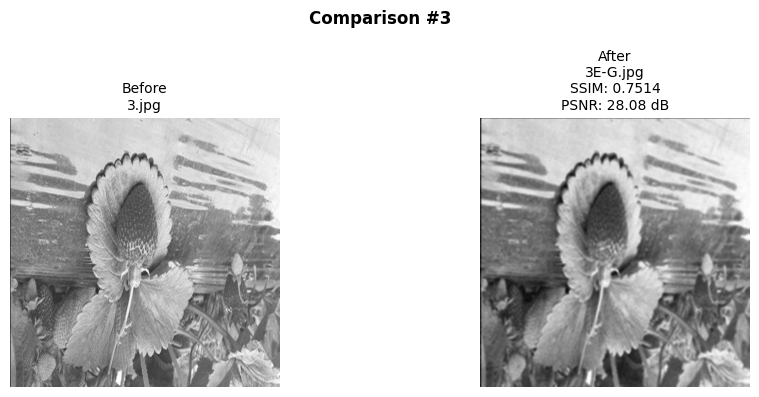

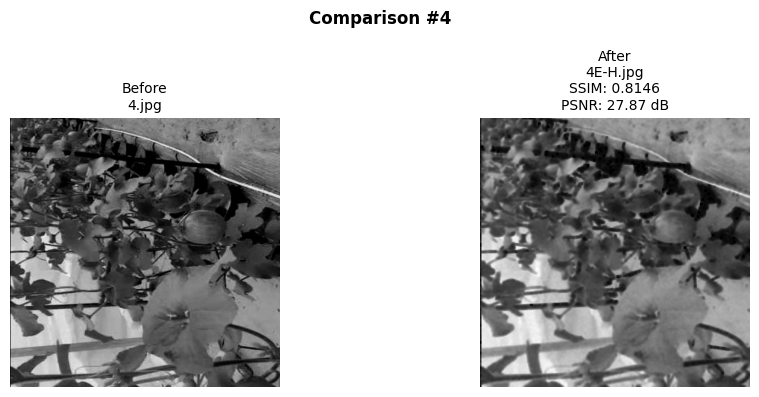

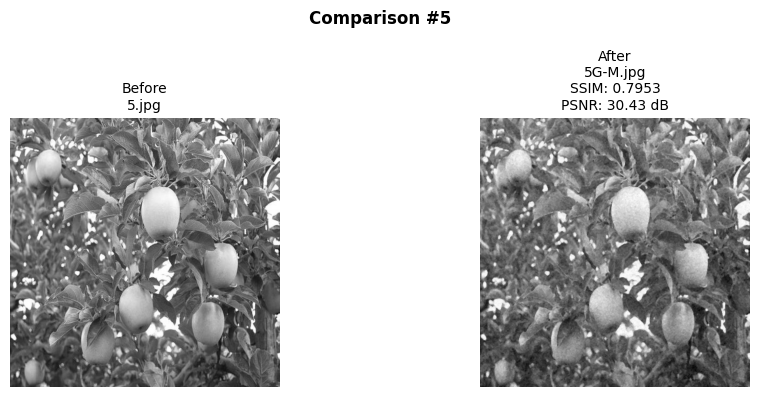

...

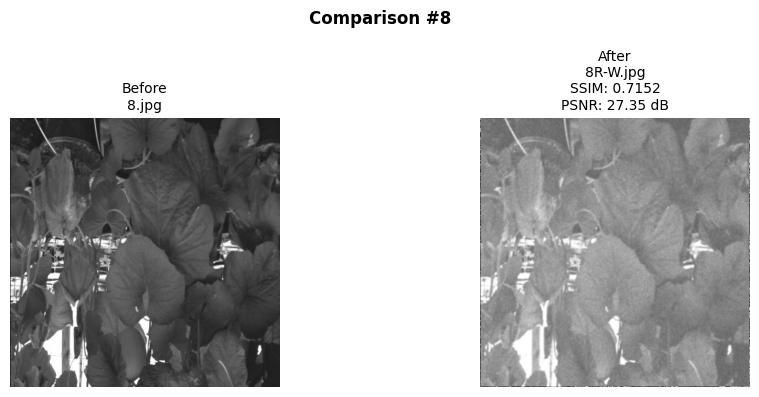

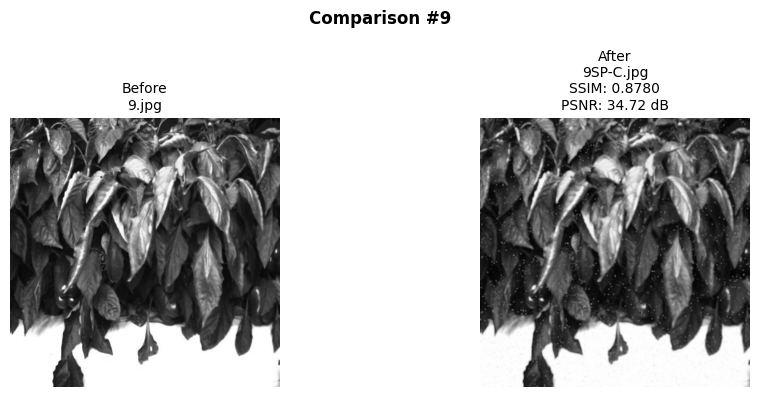

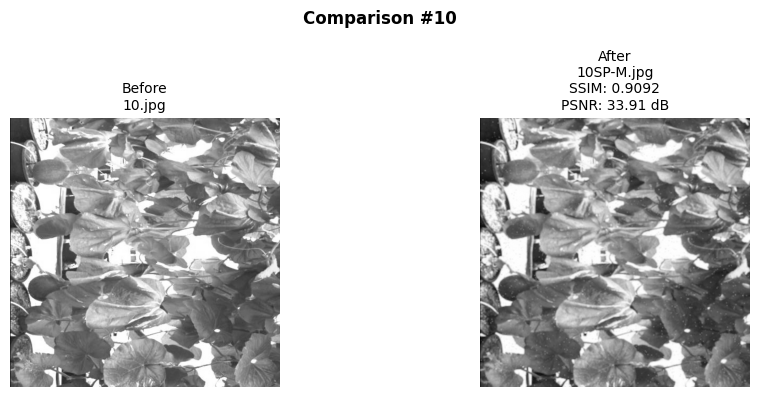

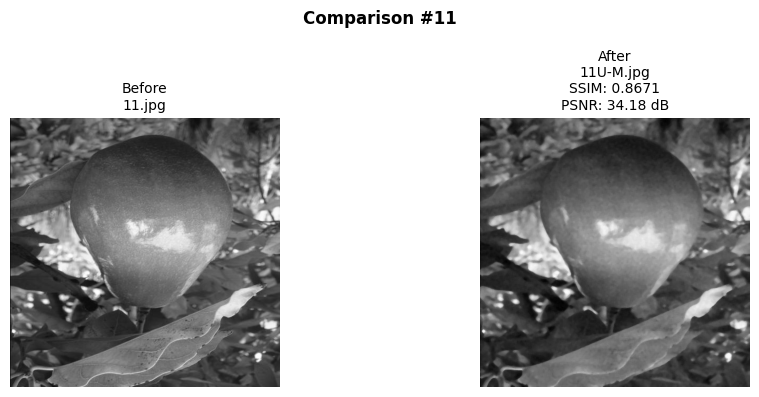

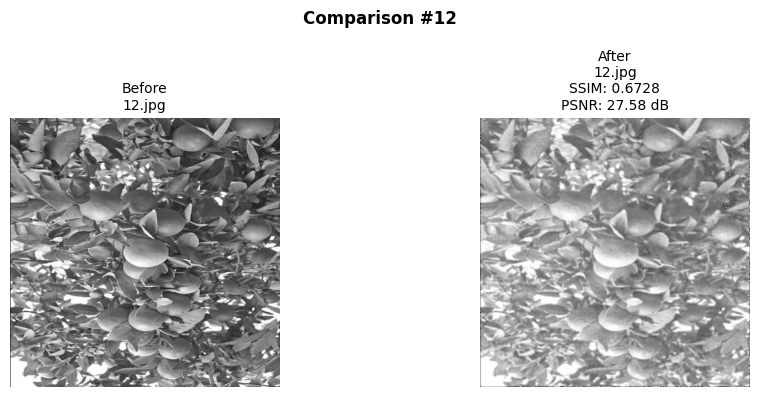


 Evaluasi selesai untuk 12 gambar.
 Rata-rata SSIM: 0.7846
 Rata-rata PSNR: 29.83 dB


In [ ]:
import os
import re
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.metrics import structural_similarity as ssim

# Path folder
gt_path = '/content/drive/MyDrive/PCD/gt grayscale ver 2'
filtered_path = '/content/drive/MyDrive/PCD/filtered grayscale ver 2'

# Ekstensi yang valid
valid_ext = ['.jpg', '.jpeg', '.png']

# Fungsi natural sorting
def natural_key(filename):
    return [int(text) if text.isdigit() else text.lower() for text in re.split(r'(\d+)', filename)]

# Ambil dan urutkan gambar
def get_image_files(folder):
    files = [f for f in os.listdir(folder) if any(f.lower().endswith(ext) for ext in valid_ext)]
    return sorted(files, key=natural_key)

# Ambil list file
gt_files = get_image_files(gt_path)
filtered_files = get_image_files(filtered_path)

# Cek jumlah file
if len(gt_files) != len(filtered_files):
    raise ValueError(f" Jumlah file tidak sama: GT = {len(gt_files)}, Filtered = {len(filtered_files)}")

# SSIM, PSNR dan Visualisasi
ssim_scores = []
psnr_scores = []

# Fungsi untuk menghitung MSE
def calculate_mse(img1, img2):
    return np.mean((img1 - img2) ** 2)

# Fungsi untuk menghitung PSNR
def calculate_psnr(mse, max_i=255):
    if mse == 0:
        return float('inf')  # Jika MSE 0, berarti gambar identik
    return 10 * np.log10((max_i ** 2) / mse)

for i, (gt_file, filt_file) in enumerate(zip(gt_files, filtered_files)):
    gt_img = imread(os.path.join(gt_path, gt_file), as_gray=True)
    filt_img = imread(os.path.join(filtered_path, filt_file), as_gray=True)

    # Pastikan ukurannya sama
    if gt_img.shape != filt_img.shape:
        print(f"⚠️ Ukuran berbeda: {gt_file} vs {filt_file} - dilewati")
        continue

    # Hitung SSIM
    ssim_score = ssim(gt_img, filt_img)
    ssim_scores.append(ssim_score)

    # Hitung MSE dan PSNR
    mse = calculate_mse(gt_img, filt_img)
    psnr_score = calculate_psnr(mse)
    psnr_scores.append(psnr_score)

    # Tampilkan gambar Before & After
    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(gt_img, cmap='gray')
    plt.title(f"Before\n{gt_file}", fontsize=10)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(filt_img, cmap='gray')
    plt.title(f"After\n{filt_file}\nSSIM: {ssim_score:.4f}\nPSNR: {psnr_score:.2f} dB", fontsize=10)
    plt.axis('off')

    plt.suptitle(f"Comparison #{i+1}", fontsize=12, weight='bold')
    plt.tight_layout()
    plt.show()

# Rata-rata SSIM dan PSNR
if ssim_scores and psnr_scores:
    avg_ssim = np.mean(ssim_scores)
    avg_psnr = np.mean(psnr_scores)
    print(f"\n Evaluasi selesai untuk {len(ssim_scores)} gambar.")
    print(f" Rata-rata SSIM: {avg_ssim:.4f}")
    print(f" Rata-rata PSNR: {avg_psnr:.2f} dB")
else:
    print("❗Tidak ada gambar yang dievaluasi. Periksa ukuran gambar.")

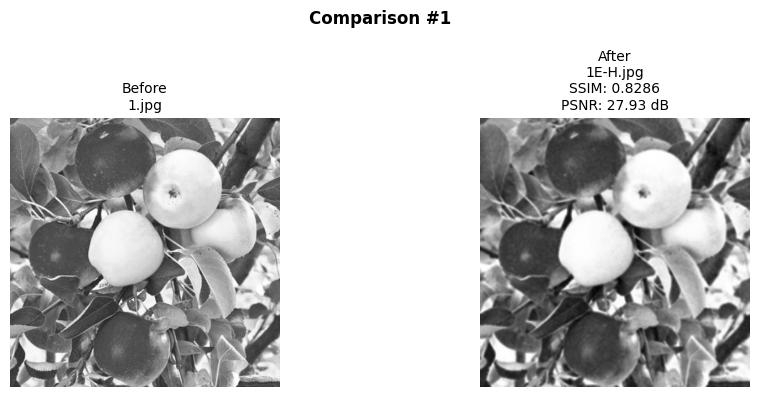

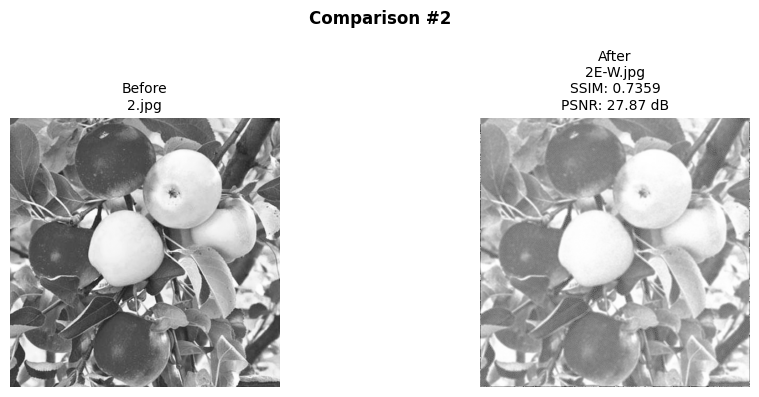

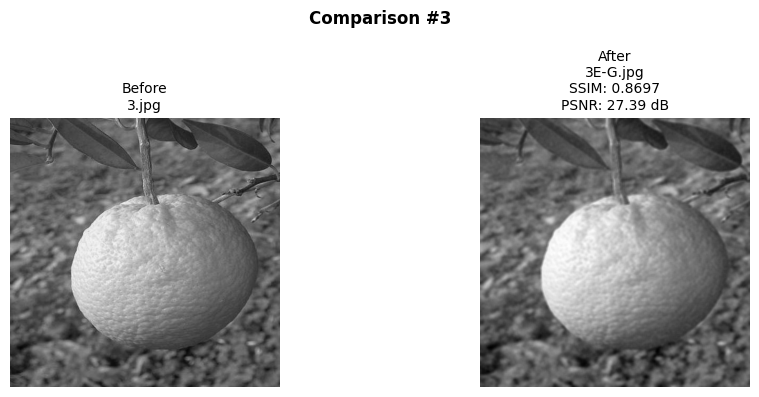

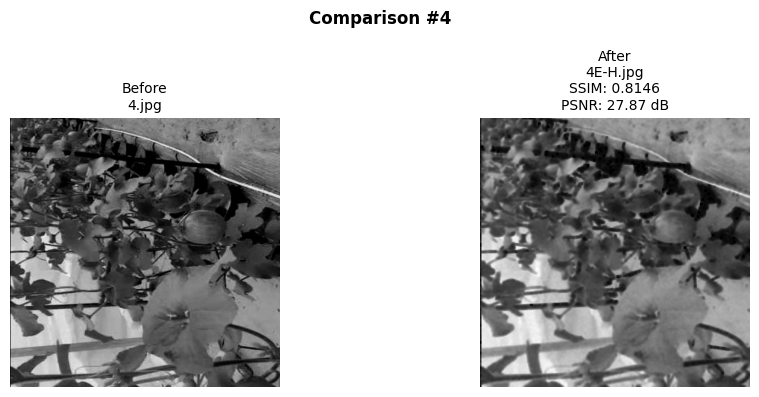

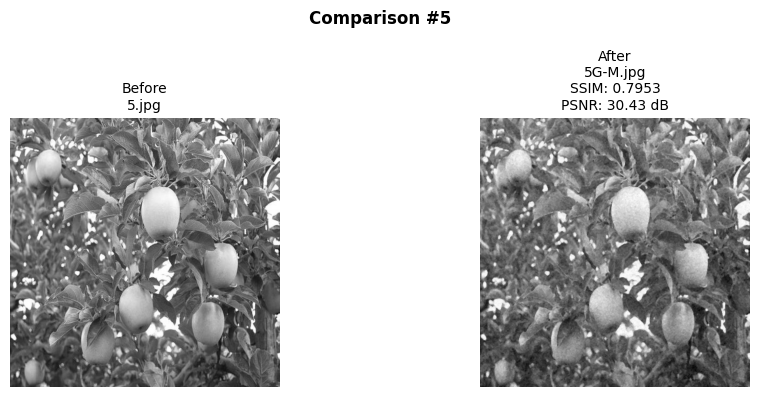

...

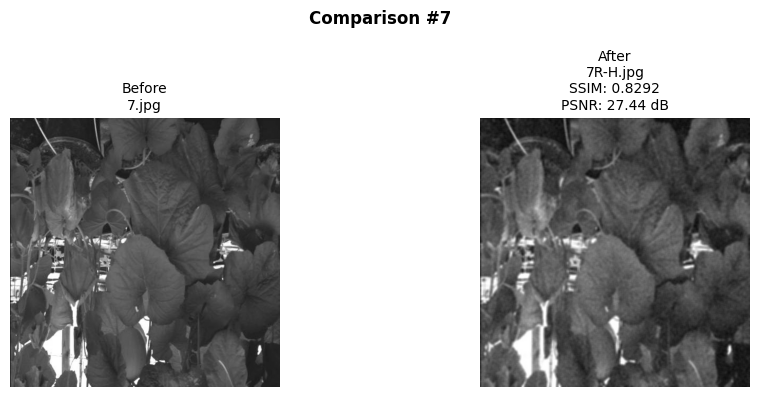

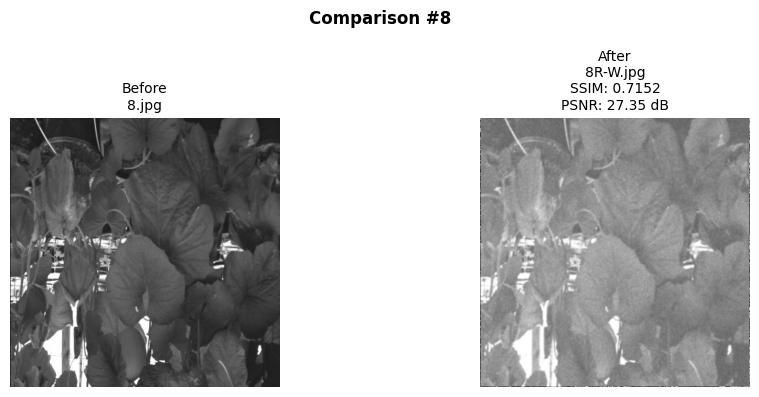

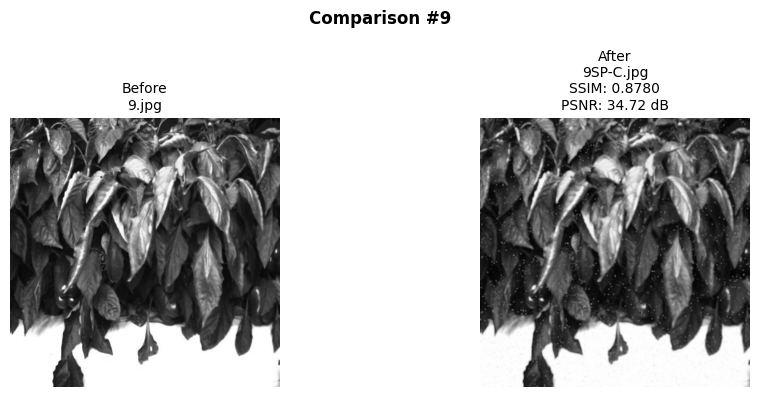

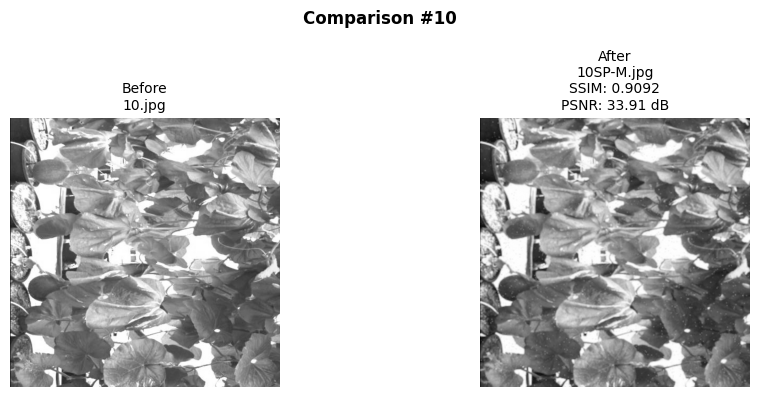

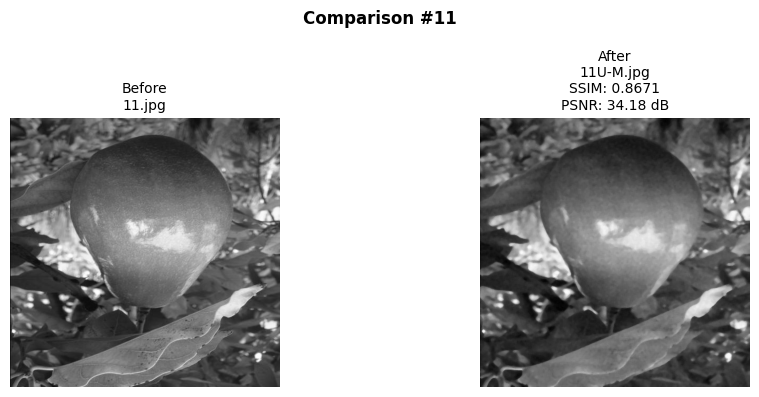


 Evaluasi selesai untuk 11 gambar.
 Rata-rata SSIM: 0.8055
 Rata-rata PSNR: 29.98 dB


In [ ]:
import os
import re
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.metrics import structural_similarity as ssim

# Path folder
gt_path = '/content/drive/MyDrive/PCD/gt grayscale ver 2'
filtered_path = '/content/drive/MyDrive/PCD/filtered grayscale ver 2'

# Ekstensi yang valid
valid_ext = ['.jpg', '.jpeg', '.png']

# Fungsi natural sorting
def natural_key(filename):
    return [int(text) if text.isdigit() else text.lower() for text in re.split(r'(\d+)', filename)]

# Ambil dan urutkan gambar
def get_image_files(folder):
    files = [f for f in os.listdir(folder) if any(f.lower().endswith(ext) for ext in valid_ext)]
    return sorted(files, key=natural_key)

# Ambil list file
gt_files = get_image_files(gt_path)
filtered_files = get_image_files(filtered_path)

# Cek jumlah file
if len(gt_files) != len(filtered_files):
    raise ValueError(f" Jumlah file tidak sama: GT = {len(gt_files)}, Filtered = {len(filtered_files)}")

# SSIM, PSNR dan Visualisasi
ssim_scores = []
psnr_scores = []

# Fungsi untuk menghitung MSE
def calculate_mse(img1, img2):
    return np.mean((img1 - img2) ** 2)

# Fungsi untuk menghitung PSNR
def calculate_psnr(mse, max_i=255):
    if mse == 0:
        return float('inf')  # Jika MSE 0, berarti gambar identik
    return 10 * np.log10((max_i ** 2) / mse)

for i, (gt_file, filt_file) in enumerate(zip(gt_files, filtered_files)):
    gt_img = imread(os.path.join(gt_path, gt_file), as_gray=True)
    filt_img = imread(os.path.join(filtered_path, filt_file), as_gray=True)

    # Pastikan ukurannya sama
    if gt_img.shape != filt_img.shape:
        print(f"⚠️ Ukuran berbeda: {gt_file} vs {filt_file} - dilewati")
        continue

    # Hitung SSIM
    ssim_score = ssim(gt_img, filt_img)
    ssim_scores.append(ssim_score)

    # Hitung MSE dan PSNR
    mse = calculate_mse(gt_img, filt_img)
    psnr_score = calculate_psnr(mse)
    psnr_scores.append(psnr_score)

    # Tampilkan gambar Before & After
    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(gt_img, cmap='gray')
    plt.title(f"Before\n{gt_file}", fontsize=10)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(filt_img, cmap='gray')
    plt.title(f"After\n{filt_file}\nSSIM: {ssim_score:.4f}\nPSNR: {psnr_score:.2f} dB", fontsize=10)
    plt.axis('off')

    plt.suptitle(f"Comparison #{i+1}", fontsize=12, weight='bold')
    plt.tight_layout()
    plt.show()

# Rata-rata SSIM dan PSNR
if ssim_scores and psnr_scores:
    avg_ssim = np.mean(ssim_scores)
    avg_psnr = np.mean(psnr_scores)
    print(f"\n Evaluasi selesai untuk {len(ssim_scores)} gambar.")
    print(f" Rata-rata SSIM: {avg_ssim:.4f}")
    print(f" Rata-rata PSNR: {avg_psnr:.2f} dB")
else:
    print("❗Tidak ada gambar yang dievaluasi. Periksa ukuran gambar.")